In [2]:
!git clone https://github.com/HeiseMax/SuperResolution.git -b experiments
!pip install piq
!pip install lpips


Cloning into 'SuperResolution'...
remote: Enumerating objects: 324, done.
remote: Counting objects: 100% (206/206), done.
remote: Compressing objects: 100% (166/166), done.
remote: Total 324 (delta 86), reused 157 (delta 38), pack-reused 118 (from 1)
Receiving objects: 100% (324/324), 201.45 MiB | 15.43 MiB/s, done.
Resolving deltas: 100% (120/120), done.


In [1]:
import os
os.chdir("SuperResolution")
import torch
import numpy as np
from torch.utils.data import DataLoader, Dataset, random_split
import torch.nn.functional as F
import torchvision.transforms as transforms
import torch.optim as optim
import os
import random
import matplotlib.pyplot as plt
from torch.nn import MSELoss
from piq import ssim
import lpips
#from torchinfo import summary
# Importing our models and utils
from models.completion.AE256 import AE
#from models.x64x64_to_256x256.HVAE_completion import ConditionalHierarchicalVAE
from models.x64x64_to_256x256.HVAE_completion_x8scale import ConditionalHierarchicalVAE
from utils.utils import gaussian_kl, PerceptualLoss
from utils.datasets import CelebA_SR, CelebA_SR_completion
from utils.datasets import Pokemon_SR
from utils.datasets import CIFAR_SR
from utils.metrics import validation_scores
from models.InterpolationModel import InterpolationModel

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [3]:
!unzip archive.zip

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
  inflating: celeba_hq_256/25000.jpg  
  inflating: celeba_hq_256/25001.jpg  
  inflating: celeba_hq_256/25002.jpg  
  inflating: celeba_hq_256/25003.jpg  
  inflating: celeba_hq_256/25004.jpg  
  inflating: celeba_hq_256/25005.jpg  
  inflating: celeba_hq_256/25006.jpg  
  inflating: celeba_hq_256/25007.jpg  
  inflating: celeba_hq_256/25008.jpg  
  inflating: celeba_hq_256/25009.jpg  
  inflating: celeba_hq_256/25010.jpg  
  inflating: celeba_hq_256/25011.jpg  
  inflating: celeba_hq_256/25012.jpg  
  inflating: celeba_hq_256/25013.jpg  
  inflating: celeba_hq_256/25014.jpg  
  inflating: celeba_hq_256/25015.jpg  
  inflating: celeba_hq_256/25016.jpg  
  inflating: celeba_hq_256/25017.jpg  
  inflating: celeba_hq_256/25018.jpg  
  inflating: celeba_hq_256/25019.jpg  
  inflating: celeba_hq_256/25020.jpg  
  inflating: celeba_hq_256/25021.jpg  
  inflating: celeba_hq_256/25022.jpg  
  inflating: celeba_hq_256/25023.jpg

In [2]:
num_epochs = 100
batch_size = 64
scalefactor = 8

latent_dims = [256, 512, 1024]
condition_dims = [128, 256]
channels = [4,8,16,32,32,32]
#cond_channels = [16, 32]
cond_channels = [32, 64, 128, 256]
in_channels = 3
cond_base_width = 256 // scalefactor
model = ConditionalHierarchicalVAE(in_channels=in_channels,
                          #latent_dims=latent_dims,
                          channels=channels,
                          cond_channels=cond_channels,
                          condition_dims=condition_dims,
                          cond_base_width=cond_base_width
                          ).to(device)
print(model.sample(torch.randn(1, in_channels, cond_base_width, cond_base_width).to(device)).shape)

torch.Size([1, 3, 256, 256])


In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
train_dataset = CelebA_SR(folder_path=r"celeba_hq_256", split="train", device=device,scale_factor=scalefactor)
val_dataset = CelebA_SR(folder_path=r"celeba_hq_256", split="val", device=device,scale_factor=scalefactor)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
num_train_data = len(train_dataset)
print(f"Dataset Loaded: {len(train_dataset)} training samples, {len(val_dataset)} validation samples")

cuda
Dataset Loaded: 24000 training samples, 6000 validation samples


In [4]:
# Adam opt
optimizer = optim.Adam(model.parameters(), lr=1e-3)
#criterion = PerceptualLoss().to(device)
#criterion = lambda x, y: -ssim(x, y)
criterion2 = MSELoss()
#criterion = lpips.LPIPS(net='vgg').to(device)
# Learning Rate Scheduler
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.9)

In [5]:
num_epochs = 100
criterion2 = MSELoss()
criterion = lpips.LPIPS(net='alex').to(device)


for epoch in range(num_epochs):
    model.train()
    total_loss, total_perceptual_loss, total_kl_loss = 0, 0, 0


    for lr_imgs,hr_imgs in train_loader:
        lr_imgs, hr_imgs = lr_imgs.to(device), hr_imgs.to(device)
        #print(hr_imgs.shape, lr_imgs.shape)
        optimizer.zero_grad()

        recon_imgs, latents = model(hr_imgs, lr_imgs)

        kl_loss = sum([torch.mean(gaussian_kl(mu, logvar, torch.zeros_like(mu), torch.zeros_like(logvar))) for mu, logvar in latents])

        mse = criterion2(recon_imgs, hr_imgs)

        loss = mse + kl_loss

        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_perceptual_loss += mse.item()
        total_kl_loss += kl_loss.item()

    scheduler.step()

    print(f"Epoch [{epoch+1}/{num_epochs}] | Loss: {total_loss:.2f} | MSE: {total_perceptual_loss:.2f} | KL: {total_kl_loss:.2f}")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 216MB/s]


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth
Epoch [1/100] | Loss: 5.53 | MSE: 2.87 | KL: 2.66
Epoch [2/100] | Loss: 1.71 | MSE: 1.66 | KL: 0.05
Epoch [3/100] | Loss: 1.67 | MSE: 1.64 | KL: 0.03
Epoch [4/100] | Loss: 1.64 | MSE: 1.63 | KL: 0.01
Epoch [5/100] | Loss: 1.65 | MSE: 1.63 | KL: 0.02
Epoch [6/100] | Loss: 1.63 | MSE: 1.62 | KL: 0.01
Epoch [7/100] | Loss: 1.61 | MSE: 1.60 | KL: 0.01
Epoch [8/100] | Loss: 1.60 | MSE: 1.59 | KL: 0.01
Epoch [9/100] | Loss: 1.58 | MSE: 1.57 | KL: 0.01
Epoch [10/100] | Loss: 1.55 | MSE: 1.54 | KL: 0.00
Epoch [11/100] | Loss: 1.52 | MSE: 1.51 | KL: 0.01
Epoch [12/100] | Loss: 1.48 | MSE: 1.47 | KL: 0.00
Epoch [13/100] | Loss: 1.44 | MSE: 1.43 | KL: 0.00
Epoch [14/100] | Loss: 1.40 | MSE: 1.40 | KL: 0.00
Epoch [15/100] | Loss: 1.36 | MSE: 1.36 | KL: 0.00
Epoch [16/100] | Loss: 1.33 | MSE: 1.32 | KL: 0.00
Epoch [17/100] | Loss: 1.30 | MSE: 1.30 | KL: 0.00
Epoch [18/100] | Loss: 1.28 | MSE: 1.28 | KL: 0.00
Epo

In [6]:
path = r"hvae_celebA_mse_100epochs.pth"
torch.save(model.state_dict(), path)


In [7]:
from google.colab import drive
drive.mount('/content/drive')

path = "/content/drive/MyDrive/hvae_celebA_mse_100epochs.pth"
torch.save(model.state_dict(), path)

Mounted at /content/drive


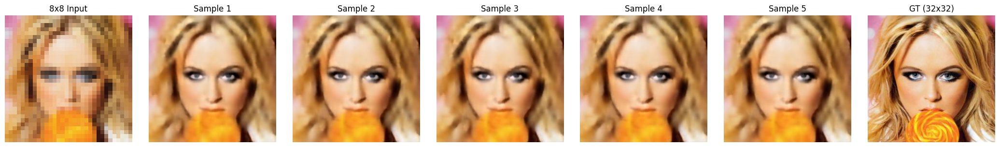

Diversity score (mean std across pixels): 0.00190
Very low diversity


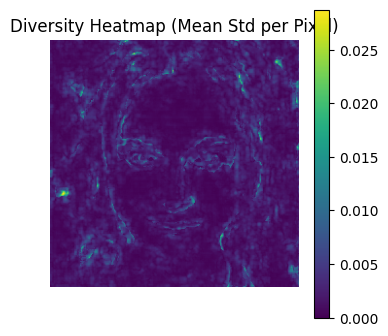

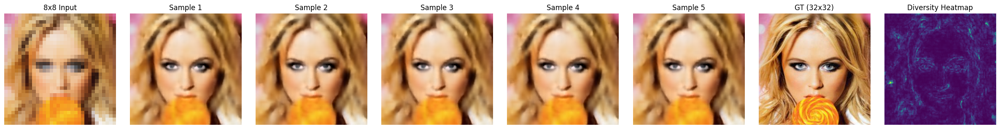

In [8]:
import random
def visualize_diversity(model, lr_img, hr_img, num_samples=5):
    model.eval()
    generated_samples = []

    with torch.no_grad():
        # Prepare input
        lr_img = lr_img.unsqueeze(0).to(device)

        # Generate multiple predictions
        for _ in range(num_samples):
            recon_img = model.sample(lr_img)  # different latent each time
            generated_samples.append(recon_img.squeeze(0).cpu())  # (3, H, W)

    # Convert images for display
    lr_np = lr_img.cpu().squeeze().numpy().transpose(1, 2, 0)
    hr_np = hr_img.cpu().numpy().transpose(1, 2, 0)
    sample_nps = [sample.numpy().transpose(1, 2, 0) for sample in generated_samples]

    # ----- First Plot: Input + Samples + GT -----
    fig1, axs1 = plt.subplots(1, num_samples + 2, figsize=(3 * (num_samples + 2), 3))
    axs1[0].imshow(lr_np)
    axs1[0].set_title("8x8 Input")
    axs1[0].axis("off")

    for i, sample_np in enumerate(sample_nps):
        axs1[i + 1].imshow(sample_np)
        axs1[i + 1].set_title(f"Sample {i+1}")
        axs1[i + 1].axis("off")

    axs1[-1].imshow(hr_np)
    axs1[-1].set_title("GT (32x32)")
    axs1[-1].axis("off")

    plt.tight_layout()
    plt.show()

    # ----- Diversity Metric & Heatmap -----
    generated_stack = torch.stack(generated_samples)  # (num_samples, 3, H, W)
    std_per_pixel = torch.std(generated_stack, dim=0)  # (3, H, W)
    diversity_score = torch.mean(std_per_pixel).item()

    print(f"Diversity score (mean std across pixels): {diversity_score:.5f}")

    if diversity_score < 0.005:
        print("Very low diversity")
    elif diversity_score < 0.02:
        print("Moderate diversity")
    else:
        print("High diversity")

    diversity_map = torch.mean(std_per_pixel, dim=0).cpu().numpy()  # (H, W)

    # ----- Second Plot: Heatmap Only -----
    plt.figure(figsize=(4, 4))
    plt.imshow(diversity_map, cmap='viridis')
    plt.title("Diversity Heatmap (Mean Std per Pixel)")
    plt.colorbar()
    plt.axis("off")
    plt.savefig(r"E:\GNN\gnn\datasets\models_neu\cifar32x32-4xscale\hvae-diversity-heatmap.png", dpi=300, bbox_inches='tight')
    plt.show()

    # ----- Third Plot: Combined Row with All -----
    fig3, axs3 = plt.subplots(1, num_samples + 3, figsize=(3 * (num_samples + 3), 3))

    axs3[0].imshow(lr_np)
    axs3[0].set_title("8x8 Input")
    axs3[0].axis("off")

    for i, sample_np in enumerate(sample_nps):
        axs3[i + 1].imshow(sample_np)
        axs3[i + 1].set_title(f"Sample {i+1}")
        axs3[i + 1].axis("off")

    axs3[-2].imshow(hr_np)
    axs3[-2].set_title("GT (32x32)")
    axs3[-2].axis("off")

    axs3[-1].imshow(diversity_map, cmap='viridis')
    axs3[-1].set_title("Diversity Heatmap")
    axs3[-1].axis("off")

    plt.tight_layout()
    plt.savefig(r"E:\GNN\gnn\datasets\models_neu\cifar32x32-4xscale\hvae-diversity-combined.png", dpi=300, bbox_inches='tight')
    plt.show()


# Pick a random LR input
lr_img,hr_img = val_dataset[random.randint(0, len(val_dataset)-1)]
visualize_diversity(model, lr_img, hr_img, num_samples=5)



In [9]:
HR, LR = val_dataset.get_samples(10)

#SR=model(HR, LR)  # Use posterior latents
SR = model.sample(LR)

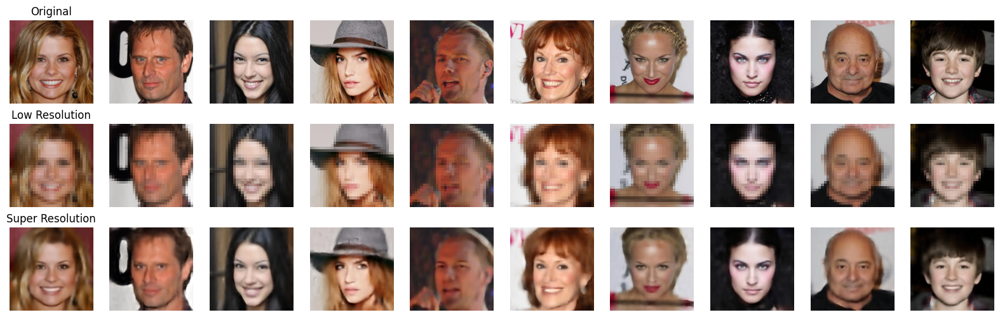

In [10]:
HR, LR = val_dataset.get_samples(10)

SR = model.sample(LR)
def show_image(x, low_res, superres, n):

    fig, axs = plt.subplots(3, n, figsize=(20, 6))
    for i in range(n):
        #figure description above every row in the middle
        if i == 0:
            axs[0, i].set_title('Original')
            axs[1, i].set_title('Low Resolution')
            axs[2, i].set_title('Super Resolution')

        axs[0, i].imshow(x[i].permute(1, 2, 0).detach().cpu().numpy(),)
        axs[0, i].axis('off')

        axs[1, i].imshow(low_res[i].permute(1, 2, 0).detach().cpu().numpy())
        axs[1, i].axis('off')
        #print(superres[i].shape)
        axs[2, i].imshow(superres[i].permute(1, 2, 0).detach().cpu().numpy())
        axs[2, i].axis('off')

show_image(HR, LR, SR, 10)

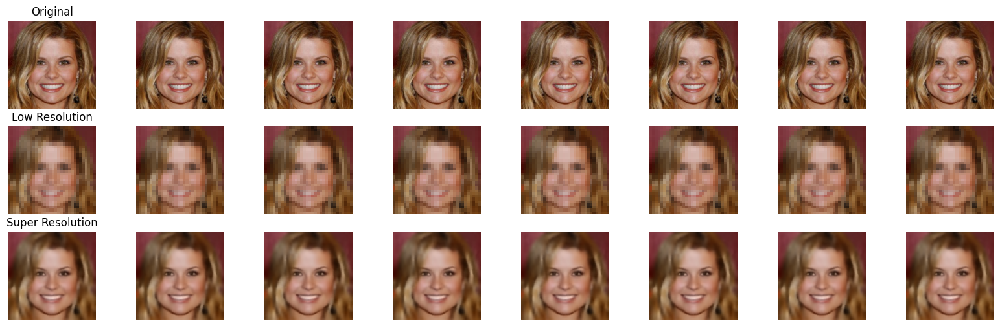

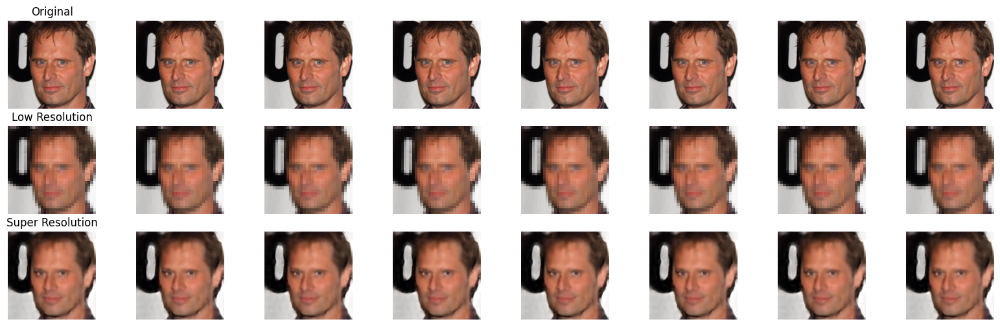

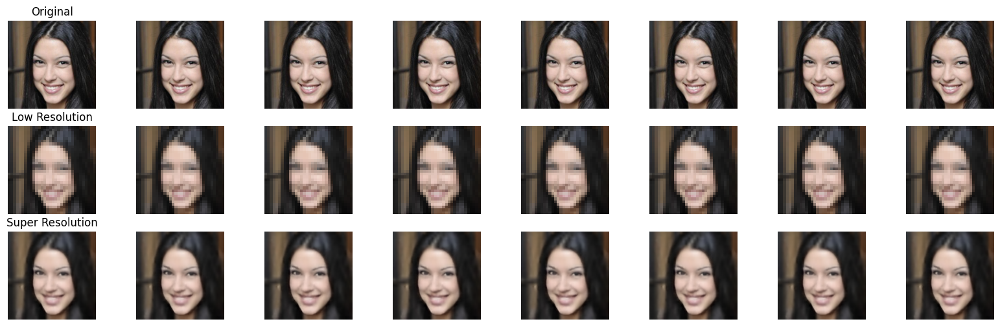

In [11]:
n_samp = 3

for i in range(n_samp):
    reference = HR[i]
    reference = reference.repeat(batch_size, 1, 1, 1)
    reference_inp = LR[i].unsqueeze(0).repeat(batch_size, 1, 1, 1)

    samples = model.sample(reference_inp).detach().cpu()

    show_image(reference, reference_inp, samples, 8)

In [4]:
num_epochs = 100
batch_size = 64
scalefactor = 8


latent_dims = [256, 512, 1024]
condition_dims = [128, 256]
channels = [4,8,16,32,32,32]
#cond_channels = [16, 32]
cond_channels = [32, 64, 128, 256]
in_channels = 3
cond_base_width = 256 // scalefactor
model = ConditionalHierarchicalVAE(in_channels=in_channels,
                          #latent_dims=latent_dims,
                          channels=channels,
                          cond_channels=cond_channels,
                          condition_dims=condition_dims,
                          cond_base_width=cond_base_width
                          ).to(device)
print(model.sample(torch.randn(1, in_channels, cond_base_width, cond_base_width).to(device)).shape)
#summary(model, input_size=[(1, in_channels, 256, 256), (1, in_channels, cond_base_width, cond_base_width)])

num_epochs = 100
batch_size = 512
scalefactor = 8
latent_dims = [64]
channels = [32, 64, 128, 256]
in_channels = 3
base_width = 32
model_ae = AE(in_channels=in_channels,
                          latent_dims=latent_dims,
                          channels=channels,
                          base_width=base_width
                          ).to(device)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
#train_dataset = CelebA_SR(folder_path=r"E:\GNN\gnn\datasets\celeba_hq_256", split="train", device=device,scale_factor=scalefactor)
#val_dataset = CelebA_SR(folder_path=r"E:\GNN\gnn\datasets\celeba_hq_256", split="val", device=device,scale_factor=scalefactor)

train_dataset = CelebA_SR_completion(folder_path=r"celeba_hq_256", split="train", device=device,scale_factor=scalefactor)
val_dataset = CelebA_SR_completion(folder_path=r"celeba_hq_256", split="val", device=device,scale_factor=scalefactor)


torch.Size([1, 3, 256, 256])
cuda


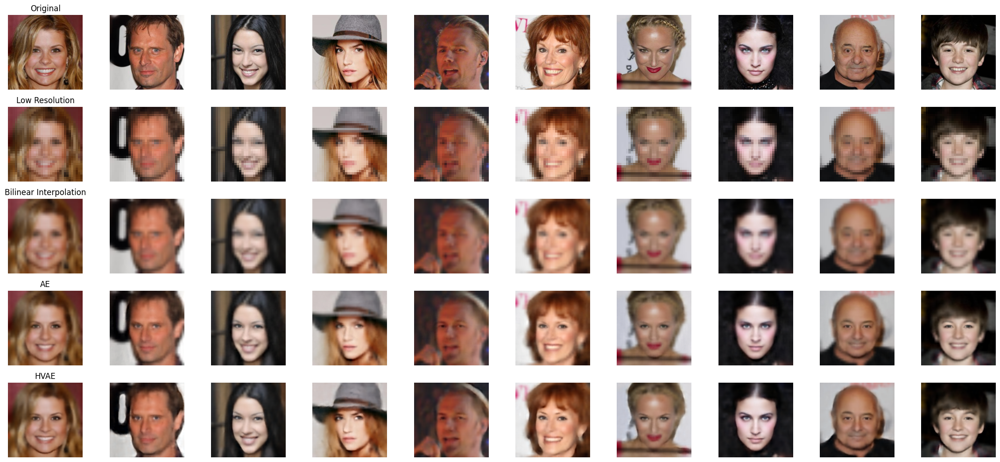

In [5]:
import matplotlib.pyplot as plt

path_mse = r"hvae_celebA_mse_50epochs.pth"
path_mse_ae = r"ae_celebA_8x_mse_completion_100epochs.pth"

model_ae.load_state_dict(torch.load(path_mse_ae))
model.load_state_dict(torch.load(path_mse))

model.eval()
model_ae.eval()

HR, LR, LR_UP = val_dataset.get_samples(40)

SR_vae = model.sample(LR)
SR_ae = model_ae(LR, LR_UP)

def show_image(x, low_res, low_res_up, superres_vae, superres_ae, n):
    fig, axs = plt.subplots(5, n, figsize=(22, 10))
    for i in range(n):
        if i == 0:
            axs[0, i].set_title('Original')
            axs[1, i].set_title('Low Resolution')
            axs[2, i].set_title('Bilinear Interpolation')
            axs[3, i].set_title('AE')
            axs[4, i].set_title('HVAE')

        axs[0, i].imshow(x[i].permute(1, 2, 0).detach().cpu().numpy())
        axs[0, i].axis('off')

        axs[1, i].imshow(low_res[i].permute(1, 2, 0).detach().cpu().numpy())
        axs[1, i].axis('off')

        axs[2, i].imshow(low_res_up[i].permute(1, 2, 0).detach().cpu().numpy())
        axs[2, i].axis('off')

        axs[3, i].imshow(superres_ae[i].permute(1, 2, 0).detach().cpu().numpy())
        axs[3, i].axis('off')

        axs[4, i].imshow(superres_vae[i].permute(1, 2, 0).detach().cpu().numpy())
        axs[4, i].axis('off')

    plt.tight_layout()
    plt.savefig(r'superres_comparison.png', dpi=300)
    plt.show()

show_image(HR, LR, LR_UP, SR_vae, SR_ae, 10)

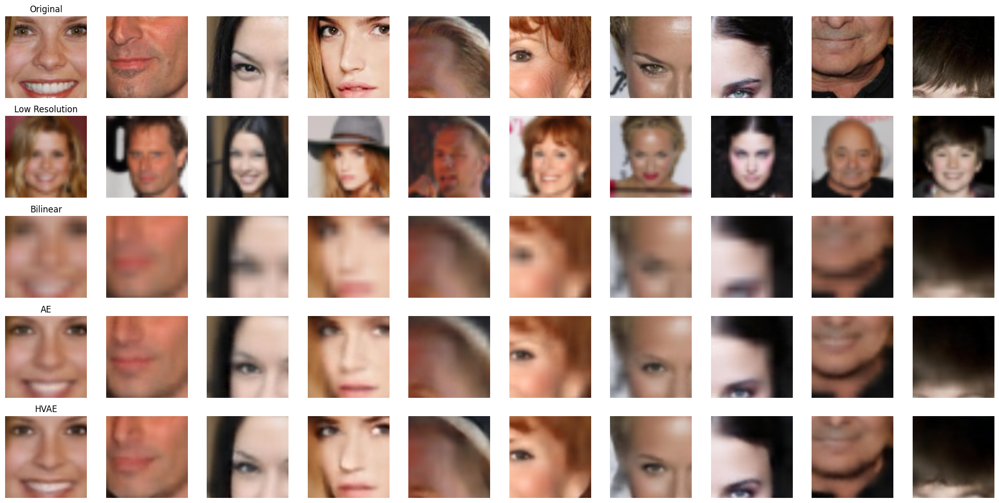

In [19]:
import torch.nn.functional as F

import torch.nn.functional as F
import random
import torch.nn.functional as F
import random

def show_zoomed_image(x, low_res, low_res_up, superres_vae, superres_ae, n=5, crop_size=64):
    """
    Show zoomed-in patches from consistent random locations per image across all variants.
    """
    fig, axs = plt.subplots(5, n, figsize=(2 * n, 10))

    def crop_at(tensor, top, left, crop_size):
        c, h, w = tensor.shape
        if h < crop_size or w < crop_size:
            tensor = F.interpolate(tensor.unsqueeze(0), size=(crop_size, crop_size), mode='bilinear', align_corners=False).squeeze(0)
            h, w = crop_size, crop_size
            top = 0
            left = 0
        return tensor[:, top:top+crop_size, left:left+crop_size]

    for i in range(n):
        # Get shape from the high-res image
        c, h, w = x[i].shape
        if h < crop_size or w < crop_size:
            top = 0
            left = 0
        else:
            top = random.randint(0, h - crop_size)
            left = random.randint(0, w - crop_size)

        if i == 0:
            axs[0, i].set_title('Original')
            axs[1, i].set_title('Low Resolution')
            axs[2, i].set_title('Bilinear')
            axs[3, i].set_title('AE')
            axs[4, i].set_title('HVAE')

        axs[0, i].imshow(crop_at(x[i], top, left, crop_size).permute(1, 2, 0).detach().cpu().numpy())
        axs[1, i].imshow(crop_at(low_res[i], top, left, crop_size).permute(1, 2, 0).detach().cpu().numpy())
        axs[2, i].imshow(crop_at(low_res_up[i], top, left, crop_size).permute(1, 2, 0).detach().cpu().numpy())
        axs[3, i].imshow(crop_at(superres_ae[i], top, left, crop_size).permute(1, 2, 0).detach().cpu().numpy())
        axs[4, i].imshow(crop_at(superres_vae[i], top, left, crop_size).permute(1, 2, 0).detach().cpu().numpy())

        for row in range(5):
            axs[row, i].axis('off')

    plt.tight_layout()
    plt.savefig(r'superres_comparison_zoomed.png', dpi=300)
    plt.show()


show_zoomed_image(HR, LR, LR_UP, SR_vae, SR_ae, n=10, crop_size=100)



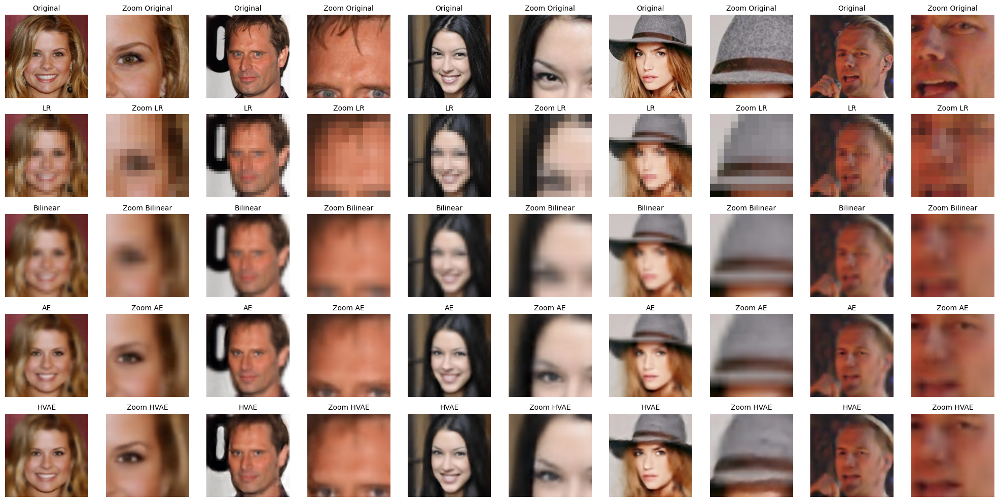

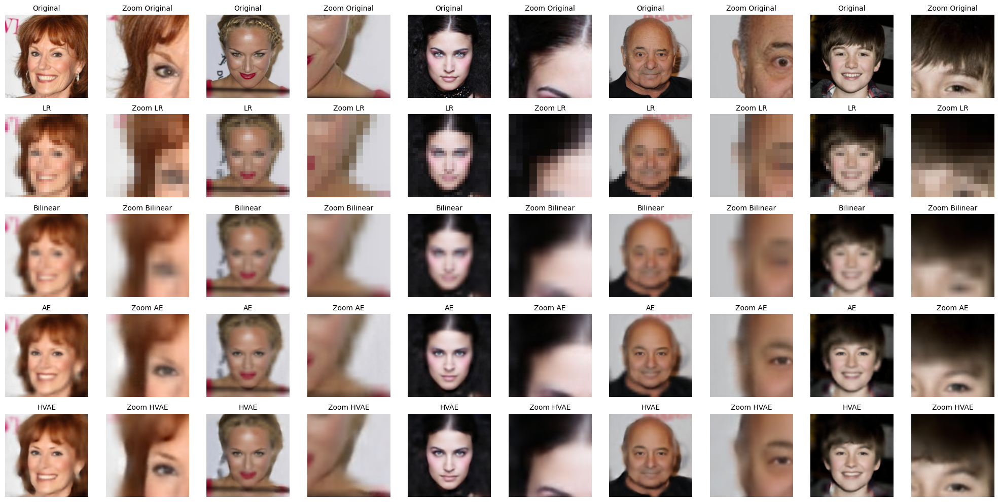

In [36]:
import torch.nn.functional as F
import random
import matplotlib.pyplot as plt

def side_by_side_zoom_grid(x, low_res, low_res_up, superres_vae, superres_ae, n=5, crop_size=64, filename='superres_side_by_side_zoom.png'):
    """
    Each sample takes 2 columns (full, zoomed) in the grid.
    Each row is one of the methods (Original, LR, Bilinear, AE, HVAE).
    Total layout: 5 rows × (2 * n) columns.
    Saves output to the specified filename.
    """
    fig, axs = plt.subplots(5, 2 * n, figsize=(4 * n, 10))

    def crop_at(tensor, top, left, crop_size):
        c, h, w = tensor.shape
        if h < crop_size or w < crop_size:
            tensor = F.interpolate(tensor.unsqueeze(0), size=(crop_size, crop_size), mode='bilinear', align_corners=False).squeeze(0)
            h, w = crop_size, crop_size
            top = 0
            left = 0
        return tensor[:, top:top+crop_size, left:left+crop_size]

    row_labels = ["Original", "LR", "Bilinear", "AE", "HVAE"]

    for i in range(n):
        # Random crop location per sample
        c, h, w = x[i].shape
        if h < crop_size or w < crop_size:
            top = 0
            left = 0
        else:
            top = random.randint(0, h - crop_size)
            left = random.randint(0, w - crop_size)

        variants = [
            (x[i], "Original"),
            (low_res[i], "LR"),
            (low_res_up[i], "Bilinear"),
            (superres_ae[i], "AE"),
            (superres_vae[i], "HVAE")
        ]

        for row, (img, label) in enumerate(variants):
            axs[row, i * 2].imshow(img.permute(1, 2, 0).detach().cpu().numpy())

            if row == 1:  # Special handling for Low Res zoom
                scale = x[i].shape[-1] // img.shape[-1]
                lr_crop_top = top // scale
                lr_crop_left = left // scale
                lr_crop_size = crop_size // scale

                lr_crop = crop_at(img, lr_crop_top, lr_crop_left, lr_crop_size)
                lr_crop_up = F.interpolate(lr_crop.unsqueeze(0), size=(crop_size, crop_size), mode='nearest').squeeze(0)
                zoom_img = lr_crop_up.permute(1, 2, 0).detach().cpu().numpy()
            else:
                zoom_img = crop_at(img, top, left, crop_size).permute(1, 2, 0).detach().cpu().numpy()

            axs[row, i * 2 + 1].imshow(zoom_img)
            axs[row, i * 2].axis('off')
            axs[row, i * 2 + 1].axis('off')

            # Add alternating column titles
            axs[row, i * 2].set_title(f"{label}", fontsize=10)
            axs[row, i * 2 + 1].set_title(f"Zoom {label}", fontsize=10)

            # Add row labels on the left
            if i == 0:
                axs[row, i * 2].set_ylabel(label, fontsize=12)

    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.show()


# === Save Samples 1–5 ===
side_by_side_zoom_grid(
    HR[0:5],
    LR[0:5],
    LR_UP[0:5],
    SR_vae[0:5],
    SR_ae[0:5],
    n=5,
    crop_size=100,
    filename='superres_side_by_side_zoom_1_5.png'
)

# === Save Samples 6–10 ===
side_by_side_zoom_grid(
    HR[5:10],
    LR[5:10],
    LR_UP[5:10],
    SR_vae[5:10],
    SR_ae[5:10],
    n=5,
    crop_size=100,
    filename='superres_side_by_side_zoom_6_10.png'
)


In [21]:

scores_hvae = validation_scores(model, HR, LR)
scores_ae = validation_scores(model_ae, HR, LR)

result = {
        "Model": "HVAE",
        "MSE": scores_hvae[0],
        "Perceptual": scores_hvae[1],
        "PSNR": scores_hvae[2],
        "SSIM": scores_hvae[3],
        "LPIPS": scores_hvae[4],
        "BRISQUE": scores_hvae[5],
        "PSNR Consistency": scores_hvae[6],
        "MSE Diversity": scores_hvae[7],
        "LPIPS Diversity": scores_hvae[8],
    }
print(result)


result2 = {
        "Model": "AE",
        "MSE": scores_ae[0],
        "Perceptual": scores_ae[1],
        "PSNR": scores_ae[2],
        "SSIM": scores_ae[3],
        "LPIPS": scores_ae[4],
        "BRISQUE": scores_ae[5],
        "PSNR Consistency": scores_ae[6],
        "MSE Diversity": scores_ae[7],
        "LPIPS Diversity": scores_ae[8],
    }
print(result2)

{'Model': 'HVAE', 'MSE': 0.0034227105788886547, 'Perceptual': 6.861567974090576, 'PSNR': 25.382253646850586, 'SSIM': 0.7239007949829102, 'LPIPS': 0.3458120822906494, 'BRISQUE': 67.86754608154297, 'PSNR Consistency': 36.947853088378906, 'MSE Diversity': 1.0929597328512841e-05, 'LPIPS Diversity': 0.007990323107151198}
{'Model': 'AE', 'MSE': 0.004166381899267435, 'Perceptual': 6.940080165863037, 'PSNR': 24.40275764465332, 'SSIM': 0.6998353004455566, 'LPIPS': 0.3620636463165283, 'BRISQUE': 63.503658294677734, 'PSNR Consistency': 33.8316535949707, 'MSE Diversity': 1.3392642021313606e-17, 'LPIPS Diversity': 1.3974515933323772e-08}


In [20]:


interp_model = InterpolationModel(size=HR.shape[-1])  # Assuming HR is [B, C, H, W]

# Get scores
scores_interp = validation_scores(interp_model, HR, LR)

# Format into a result dictionary
result_interp = {
    "Model": "Interpolation",
    "MSE": scores_interp[0],
    "Perceptual": scores_interp[1],
    "PSNR": scores_interp[2],
    "SSIM": scores_interp[3],
    "LPIPS": scores_interp[4],
    "BRISQUE": scores_interp[5],
    "PSNR Consistency": scores_interp[6],
    "MSE Diversity": scores_interp[7],
    "LPIPS Diversity": scores_interp[8],
}
print(result_interp)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 226MB/s]
Downloading: "https://github.com/photosynthesis-team/photosynthesis.metrics/releases/download/v0.4.0/lpips_weights.pt" to /root/.cache/torch/hub/checkpoints/lpips_weights.pt
Downloading: "https://github.com

{'Model': 'Interpolation', 'MSE': 0.004899321123957634, 'Perceptual': 7.29525089263916, 'PSNR': 23.587160110473633, 'SSIM': 0.6838602423667908, 'LPIPS': 0.4103066921234131, 'BRISQUE': 83.51853942871094, 'PSNR Consistency': 31.552133560180664, 'MSE Diversity': 0.0, 'LPIPS Diversity': 0.0}
